# Assignment: Computing H without for loops

Write python code to compute $\mathbf{H}$ and $\mathbf{b}$ given samples $\{(x_1, y_1), \cdots, (x_n, y_n)\}$ **without** for-loops.

>> def compute_H (X, Y) : -- returns 2 by 2 matrix H

>> def compute_b (X, Y) : -- returns 2 by 1 matrix b

X is an np.array of size N by 1, and Y is an np.array of size N by 1. They store the x and y values in correspondence order; X [i] is associated with Y[i].

Write code to also test your implementation by using synthetic data generated using known noisy model and estimating the parameters.

# Solution

In [ ]:
import numpy as np

#---------------------------------------------
# Summation By Using Matix Multiplication
#
# The summation is calculated by performing
# the dot product with a vector of ones:
#
# [1,1,1,1...]|X1|
#             |X2|
#             |X3|
#             |: |
#             |Xn|
# = Summation of X1 to Xn
#--------------------------------------------
def Summation(matrix):
    row , column = matrix.shape
    # returns a vector of ones [1,1,1,1...]
    vector_of_ones = np.ones(row)
    # This dot product will return the sumation
    #

    summation = np.dot(vector_of_ones,matrix)
    return summation.item(0)

#---------------------------------------------
# Computes H without for loops
#
# returns 2 by 2 matrix H
#--------------------------------------------
def compute_H(X,Y):
    Nx , columnx = X.shape
    Ny , columny = Y.shape

    # Check X and Y are the same shape
    if Nx != Ny or columnx != 1 or columny != 1:
        print("ERROR!!")
        print("Matrizes X and Y should be the same shape N by 1")
        return np.zeros((2,2))

    N = Nx
    # Compute H without for loops
    H = np.matrix([
                    [Summation(np.square(X)), Summation(X)],
                    [Summation(X)           , N           ]
                  ])
    return H

#---------------------------------------------
# Computes b without for loops
#
# returns 2 by 1 matrix b
#--------------------------------------------
def compute_b(X,Y):
    Nx , columnx = X.shape
    Ny , columny = Y.shape

    # Check X and Y are the same shape
    if Nx != Ny or columnx != 1 or columny != 1:
        print("ERROR!!")
        print("Matrizes X and Y should be the same shape N by 1")
        return np.zeros((2,1))

    # Compute b without for loops
    b = np.matrix([
                    [Summation((Y - X)*X)],
                    [Summation(Y - X)]
                  ])
    return b

# Running Test

In [ ]:
min_val_rand = 0
max_val_rand = 5

N = 3

# X is an np.array of size N by 1
X = np.random.randint(min_val_rand,max_val_rand,(N,1))
print("X=")
print(X)

# Y is an np.array of size N by 1
Y = np.random.randint(min_val_rand,max_val_rand,(N,1))
print("\nY=")
print(Y)

print("\ncompute H=")
print(compute_H(X,Y))

print("\ncompute b=")
print(compute_b(X,Y))


X=
[[3]
 [1]
 [2]]

Y=
[[4]
 [2]
 [3]]

compute H=
[[14.  6.]
 [ 6.  3.]]

compute b=
[[6.]
 [3.]]


# Assignment -- Sensitivity to outlier matches


Change the number of matches (NUM_MATCHES) selected from 8 to 10 to 20 and document the effect observed. Do you have any suggestions for performing estimation in the presence of outlier (wrong) matches)?

In [ ]:
import numpy as np
import torch

import matplotlib.pyplot as plt
import scipy.ndimage as scimage
import torch.nn as nn

# need to install this version of opencv so that we have access to SIFT
# which is now outside patent protection
!pip install opencv-contrib-python
import cv2
print (cv2 .__version__)

np.set_printoptions(precision=2, suppress=True)

from skimage import io

from skimage.transform import warp

4.8.0


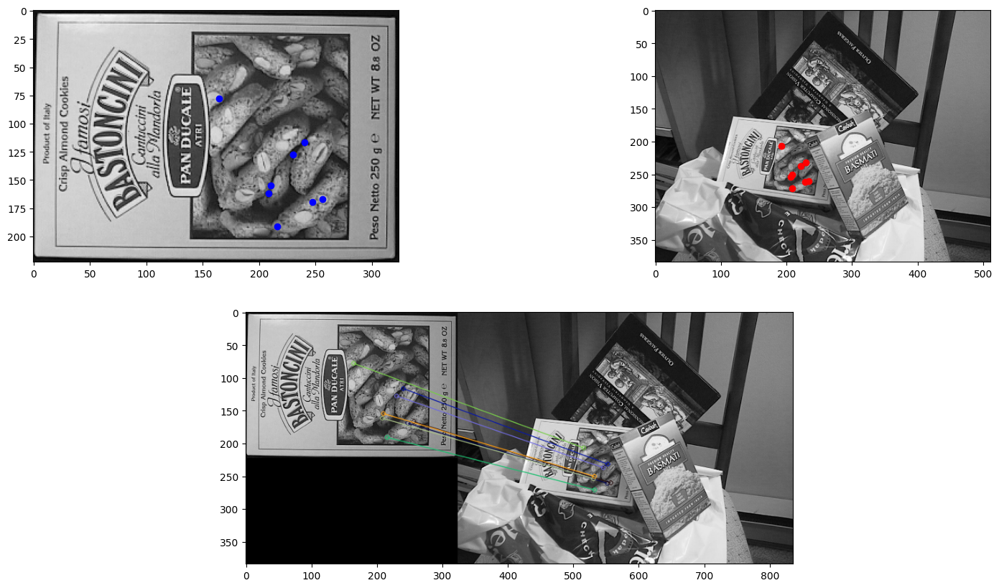

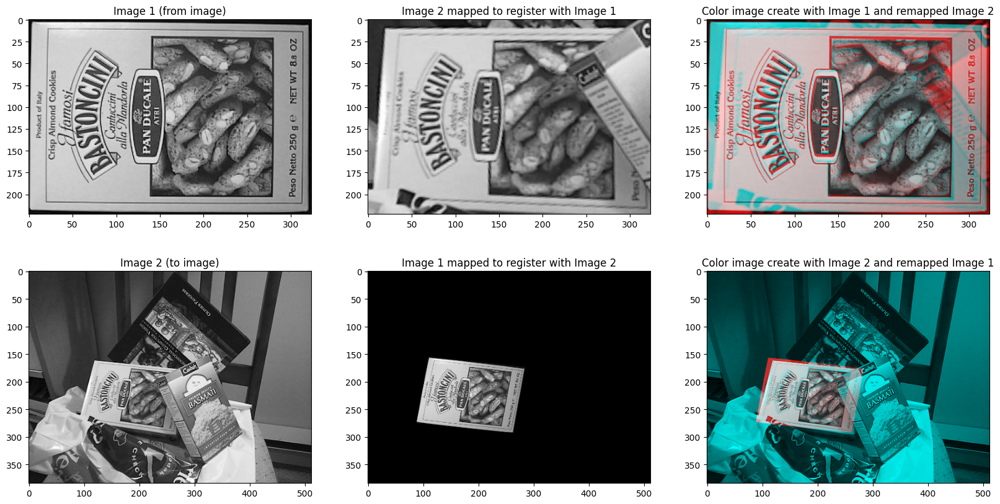

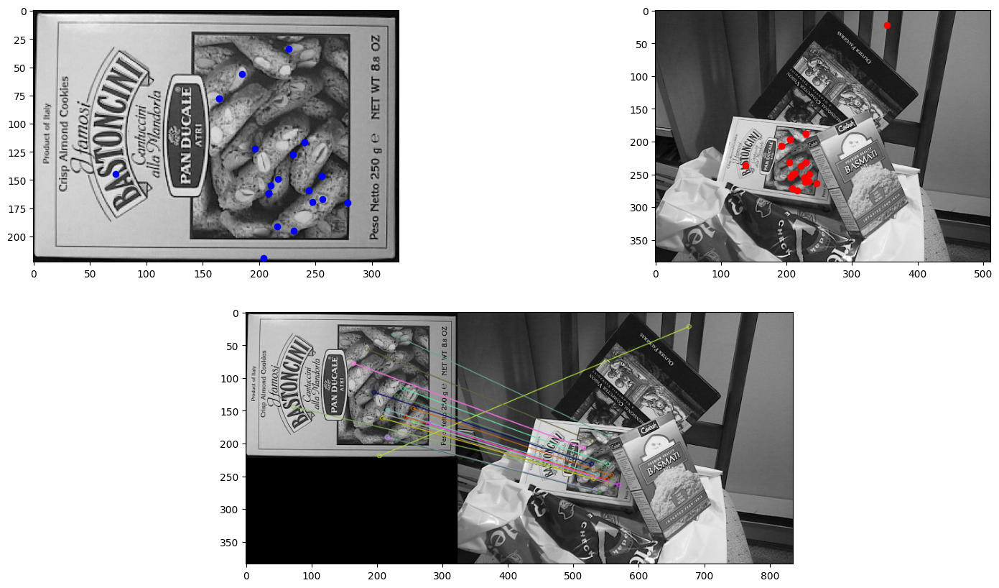

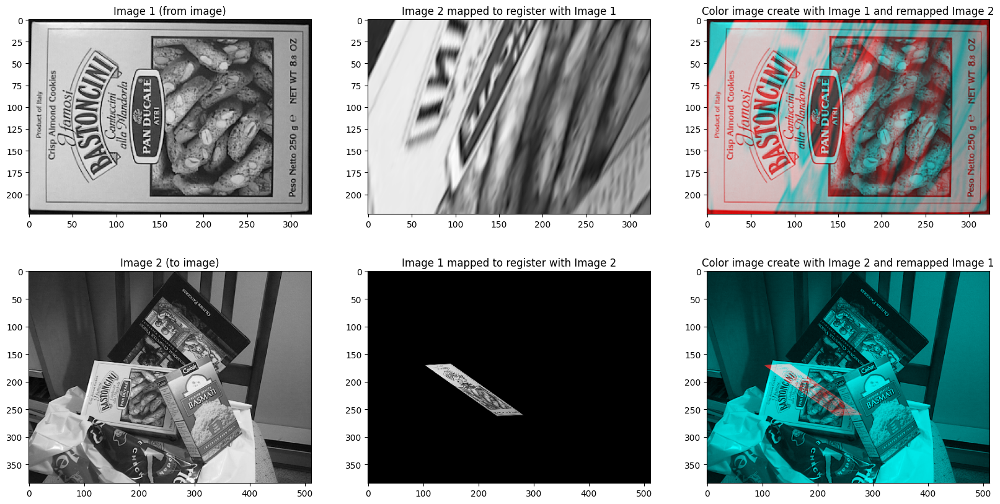

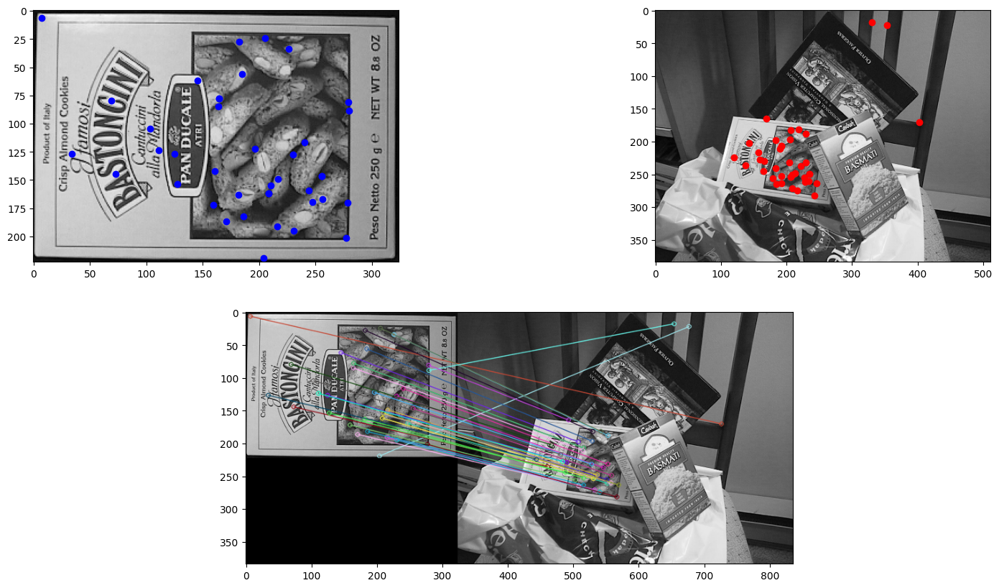

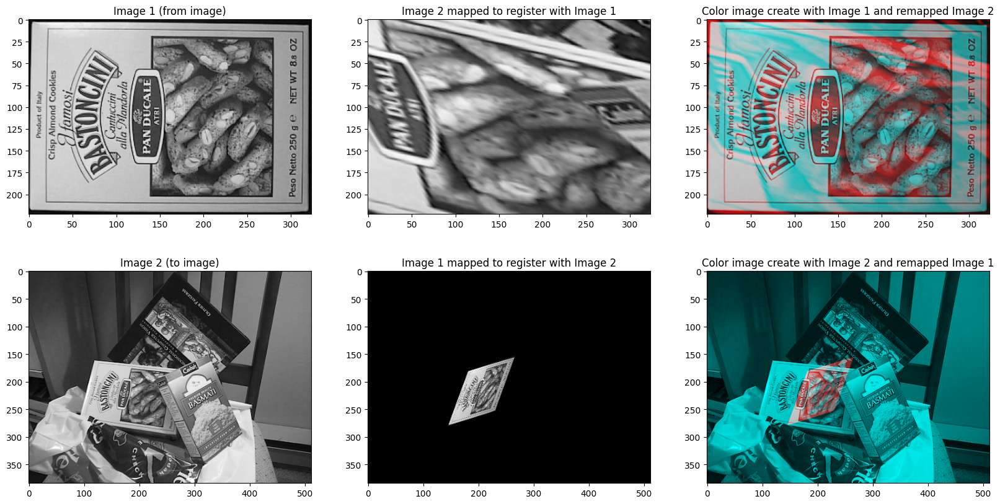

In [65]:
def qr_solve (H, b) :
    # H is n by n matrix, b is a n by 1 vector
    # returns a n by 1 vector as a solution

    Q, R = np.linalg.qr(H, 'reduced')
    b_dash = Q.transpose(1,0) @ b
    Np = b_dash.shape[0]
    del_p = np.zeros((Np, 1))
    for i in range(Np-1, -1, -1): # work from the last row of R
        sum_r_p = [0]
        for j in range(i+1, Np, 1) :
            sum_r_p += R[i, j]*del_p[j]
        del_p[i] = (b_dash[i]- sum_r_p)/R[i,i]

    return(del_p)

def fit_affine (Points_1, Points_2) :
    # input: two 2D points sets, each of size N by 2
    # output: residual of fit and the best fitting affine transformation

    # Rearrange the points in 3 by N arrays of homogeneous representation of the points
    X = np.row_stack((Points_1.transpose(1,0), np.ones((1, Points_1.shape[0]))))
    X_dash = np.row_stack((Points_2.transpose(1,0), np.ones((1, Points_2.shape[0]))))

    # Compute the matrix H from the point coordinate moments
    M = X @ X.transpose(1,0)
    H1 = np.column_stack((M, np.zeros((3,3))))
    H2 = np.column_stack((np.zeros((3,3)), M))
    H = np.row_stack((H1, H2))

    # vector b
    b_dash = X @ (X_dash - X).transpose(1,0)
    b = np.row_stack((b_dash[:,0][:,None], b_dash[:,1][:,None]))

    p = qr_solve (H, b)
    p = p.squeeze()

    # the parameter vector is [a_00, a_01, t_x, a_10, a_11, t_y]
    # rearrange it back into homogeneous matrix representation
    T_affine = np.row_stack((p.reshape(2, 3), [0, 0, 0])) + np.eye(3)
    T_affine_inv = np.linalg.inv(T_affine)

    X_t = T_affine @ X
    residual_error = np.sum(np.power((X_dash - X_t), 2))
    residual_error = np.sqrt(residual_error/X.shape[1])

    return(residual_error, T_affine)

def Detect_SIFT(NUM_MATCHES,image_1,image_2):
    #-------------Detect SIFT features--------------------------
    sift = cv2.SIFT_create(nOctaveLayers = 3, contrastThreshold = 0.04, edgeThreshold = 10, sigma = 1.6)
    keypoints_1, descriptors_1 = sift.detectAndCompute(image_1, None)
    keypoints_2, descriptors_2 = sift.detectAndCompute(image_2, None)

    # -------------Match SIFT features--------------------------
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
    matches = bf.match(descriptors_1, descriptors_2)
    matches = sorted(matches, key = lambda x:x.distance)
    # extract list of corresponding point location pairs
    X_1 = []
    X_2 = []
    for i in range(NUM_MATCHES) :
        X_1.append([keypoints_1[matches[i].queryIdx].pt[0], keypoints_1[matches[i].queryIdx].pt[1]])
        X_2.append([keypoints_2[matches[i].trainIdx].pt[0], keypoints_2[matches[i].trainIdx].pt[1]])
    X_1 = np.array(X_1)
    X_2 = np.array(X_2)

    #----------------------------------Display-------------------------------------------------------
    # create an visualization on the matched on an image
    match_image = cv2.drawMatches(image_1, keypoints_1, image_2, keypoints_2, matches[0:NUM_MATCHES], image_2, flags=2)

    plt.figure(figsize=(20,10))
    plt.subplot(221)
    plt.imshow(image_1, 'gray')
    plt.plot(X_1[:,0], X_1[:,1], 'bo')
    plt.subplot(222)
    plt.imshow(image_2, 'gray')
    plt.plot(X_2[:,0], X_2[:,1], 'ro')
    plt.subplot(212)
    plt.imshow(match_image);

    return X_1, X_2



def Transform(X_1, X_2):

    # Code: Computing  H  and  b
    X = np.row_stack((X_1.transpose(1,0), np.ones((1, X_1.shape[0]))))

    X_dash = np.row_stack((X_2.transpose(1,0), np.ones((1, X_2.shape[0]))))

    M = X @ X.transpose(1,0)
    H1 = np.column_stack((M, np.zeros((3,3))))
    H2 = np.column_stack((np.zeros((3,3)), M))
    H = np.row_stack((H1, H2))

    b_dash = X @ (X_dash - X).transpose(1,0)
    b = np.row_stack((b_dash[:,0][:,None], b_dash[:,1][:,None]))

    #----------------------------------------------------------------
    residual_error, T_affine = fit_affine(X_1, X_2)
    #----------------------------------------------------------------

    #----------------------------Display----------------------------
    T_affine_inv = np.linalg.inv(T_affine)

    warped_1_into_2 = warp(image_1, inverse_map=T_affine_inv, output_shape=image_2.shape)

    warped_2_into_1 = warp(image_2, inverse_map=T_affine, output_shape=image_1.shape)

    # build an RGB image with the registered images -- should be white if match is perfect
    seq_im_1_into_2 = np.zeros((image_2.shape[0], image_2.shape[1], 3))
    seq_im_1_into_2[..., 0] = warped_1_into_2
    seq_im_1_into_2[..., 1] = image_2/255
    seq_im_1_into_2[..., 2] = image_2/255

    seq_im_2_into_1 = np.zeros((image_1.shape[0], image_1.shape[1], 3))
    seq_im_2_into_1[..., 0] = warped_2_into_1
    seq_im_2_into_1[..., 1] = image_1/255
    seq_im_2_into_1[..., 2] = image_1/255


    plt.figure(figsize = (20, 10))
    plt.subplot(2,3,1)
    plt.imshow(image_1, 'gray')
    plt.title('Image 1 (from image)')

    plt.subplot(2,3,2)
    plt.imshow(warped_2_into_1, 'gray')
    plt.title('Image 2 mapped to register with Image 1')

    plt.subplot(2,3,3)
    plt.imshow(seq_im_2_into_1, 'gray')
    plt.title('Color image create with Image 1 and remapped Image 2')


    plt.subplot(2,3,4)
    plt.imshow(image_2, 'gray')
    plt.title('Image 2 (to image)')

    plt.subplot(2,3,5)
    plt.imshow(warped_1_into_2, 'gray')
    plt.title('Image 1 mapped to register with Image 2')

    plt.subplot(2,3,6)
    plt.imshow(seq_im_1_into_2, 'gray')
    plt.title('Color image create with Image 2 and remapped Image 1');


# ------------Read images-----------------------------------
image_1 = io.imread('https://i.stack.imgur.com/Er7vx.png')
image_2 = io.imread('https://i.stack.imgur.com/gAz96.png')
NUM_MATCHES = (8,20,40)

for num_matches in NUM_MATCHES:
    X_1, X_2 = Detect_SIFT(num_matches,image_1,image_2)
    Transform(X_1, X_2)

# Suggestion To Detect Outliers


We can see that the problem causing an erroneous transformation is when the feature extractor, this is when detecting SIFT features, returns outliers that, chances are, might not be correct.


We can utilize a linear regression or another cluster algorithm to spot outliers and remove these points before making the affine transformation

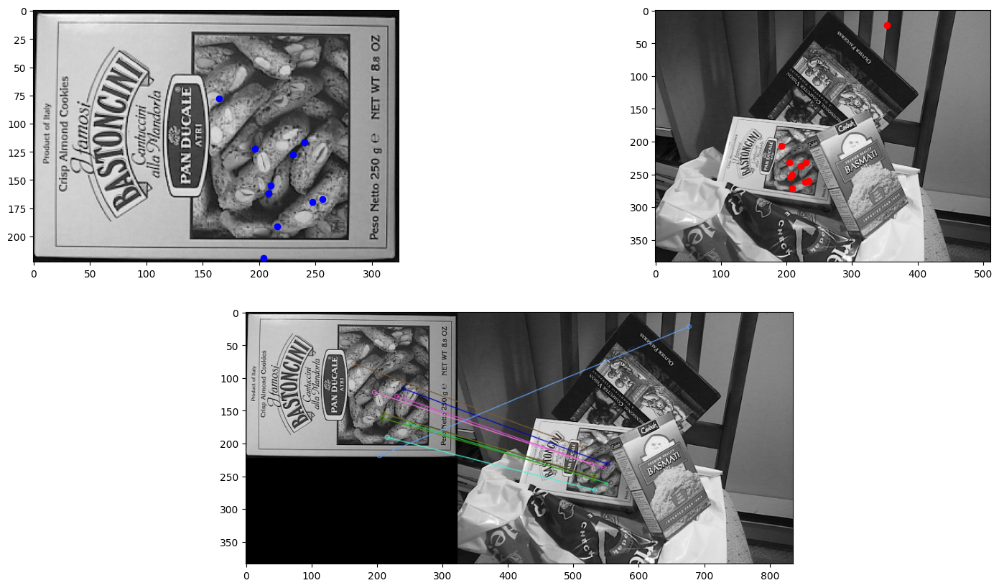

In [101]:
X_1, X_2 = Detect_SIFT(10,image_1,image_2)

# Plot Outliers

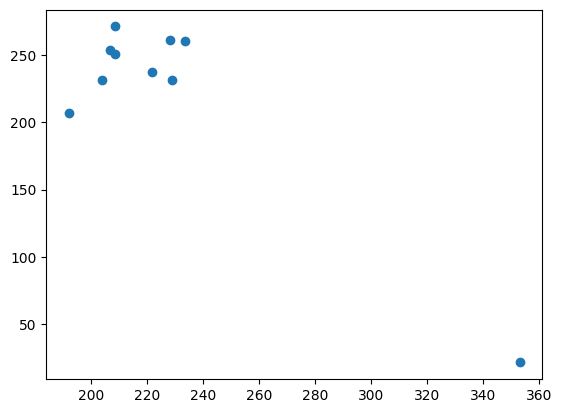

In [102]:
#plotting the results
plt.scatter(X_2[:,0] , X_2[:,1])
plt.show()

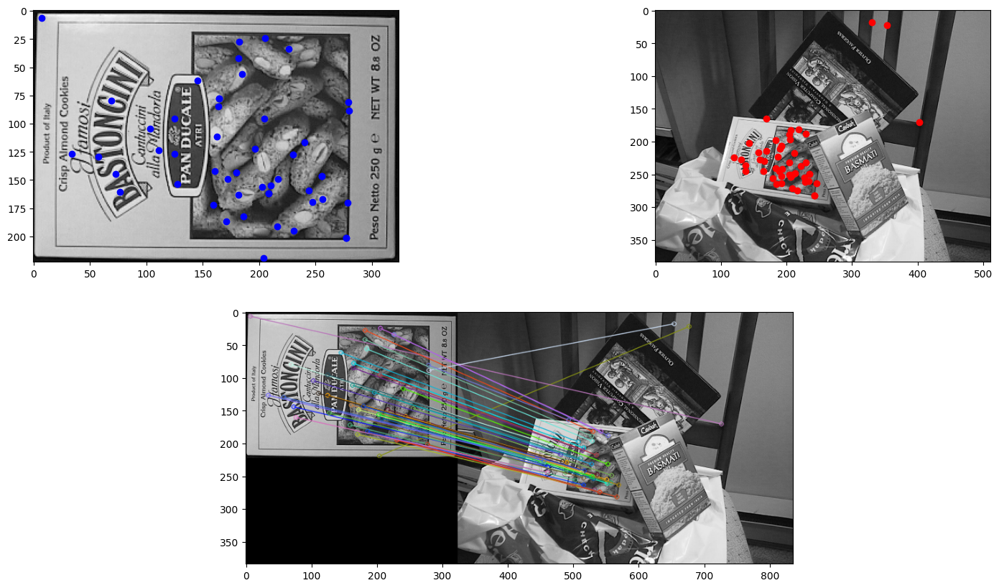

In [103]:
X_1, X_2 = Detect_SIFT(50,image_1,image_2)

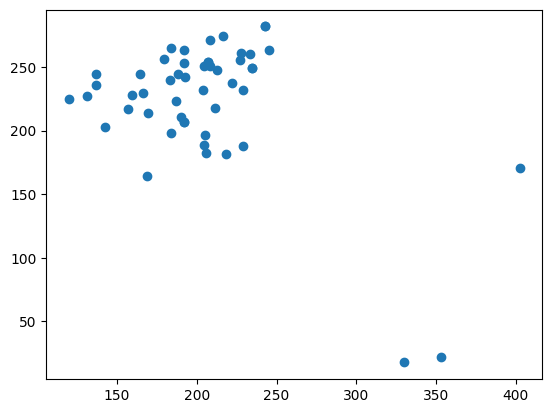

In [104]:
#plotting the results
plt.scatter(X_2[:,0] , X_2[:,1])
plt.show()

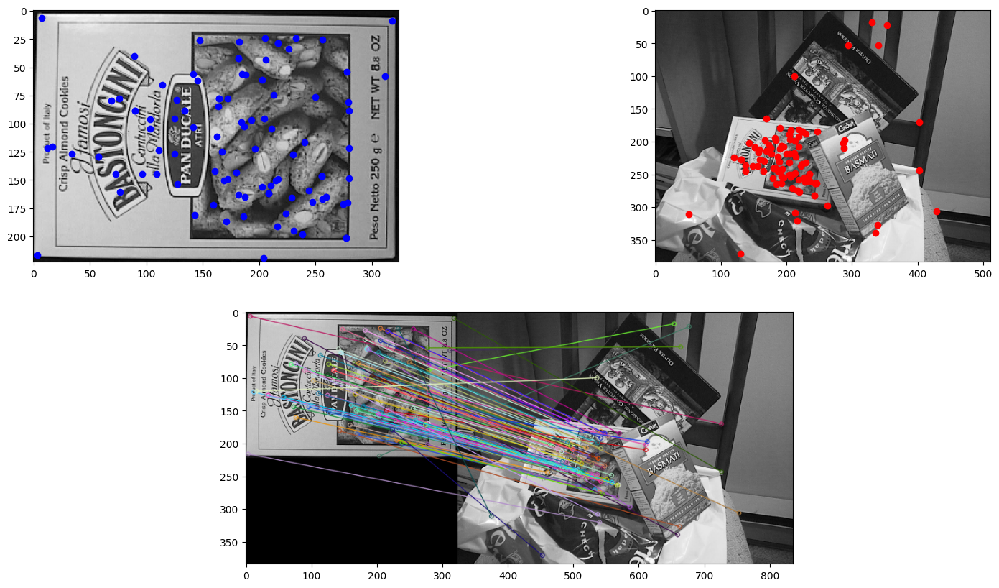

In [105]:
X_1, X_2 = Detect_SIFT(100,image_1,image_2)


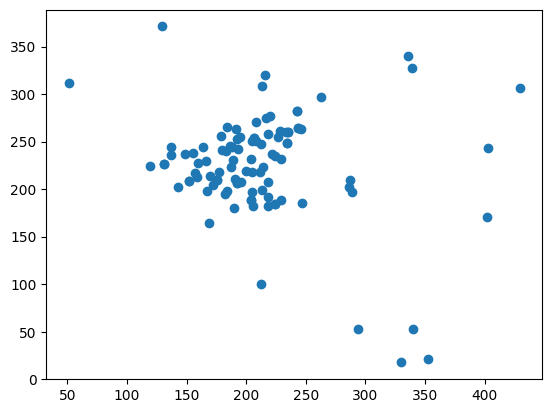

In [106]:
#plotting the results
plt.scatter(X_2[:,0] , X_2[:,1])
plt.show()

# Example

Two algorithms that can be used are Principal component analysis (PCA) and K-mean.

This example is inspired from a
[python link source](https://www.askpython.com/python/examples/plot-k-means-clusters-python)

In [112]:
import warnings
warnings.filterwarnings("ignore")

#Importing required modules

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import KMeans

def runPCA_kmeans(dataPoints):
    pca = PCA(2)

    #Transform the data
    df = pca.fit_transform(dataPoints)


    #Initialize the class object
    kmeans = KMeans(n_clusters= 2)

    #predict the labels of clusters.
    label = kmeans.fit_predict(df)

    #filter rows of original data
    filtered_label0 = df[label == 0]

    filtered_label1 = df[label == 1]

    #Plotting the results
    plt.scatter(filtered_label0[:,0] , filtered_label0[:,1] , color = 'blue')
    plt.scatter(filtered_label1[:,0] , filtered_label1[:,1] , color = 'red')
    plt.show()

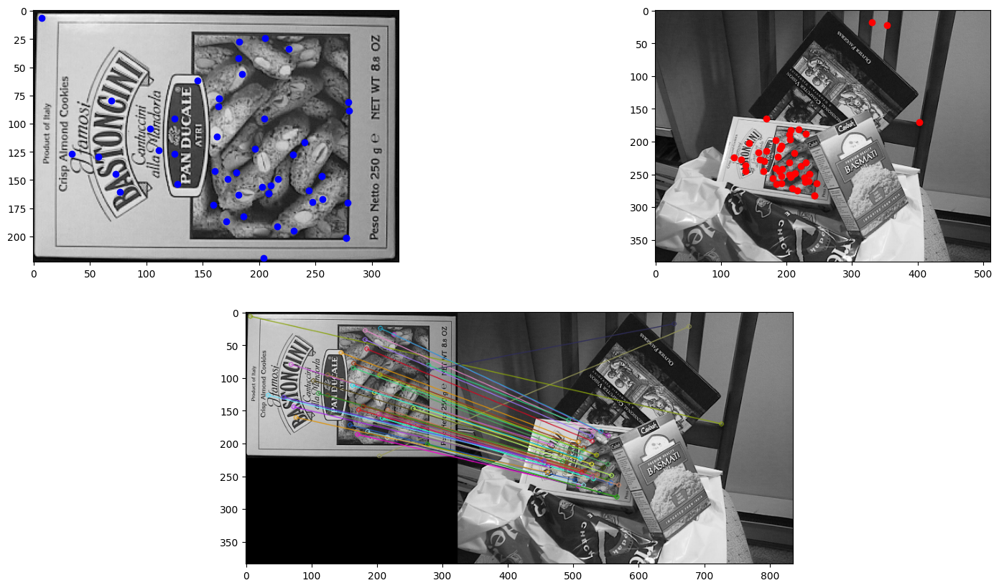

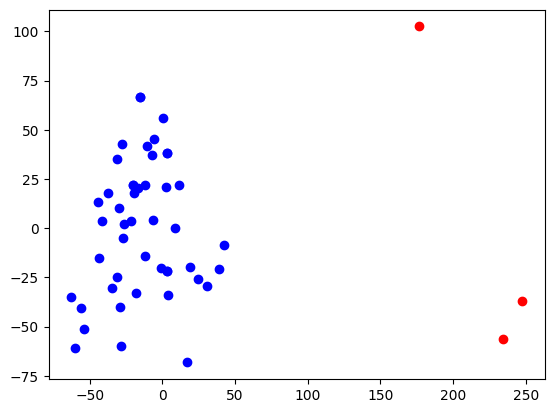

In [113]:
X_1, X_2 = Detect_SIFT(50,image_1,image_2)
plt.show()
runPCA_kmeans(X_2)

We can see that a cluster algorithm can spot outliers and we can remove these from the feature points that were found.